In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dental-image/images/cate2-00104.jpg
/kaggle/input/dental-image/images/cate8-00208.jpg
/kaggle/input/dental-image/images/cate8-00262.jpg
/kaggle/input/dental-image/images/cate8-00248.jpg
/kaggle/input/dental-image/images/cate8-00155.jpg
/kaggle/input/dental-image/images/cate8-00067.jpg
/kaggle/input/dental-image/images/cate8-00089.jpg
/kaggle/input/dental-image/images/cate8-00382.jpg
/kaggle/input/dental-image/images/cate2-00199.jpg
/kaggle/input/dental-image/images/cate2-00125.jpg
/kaggle/input/dental-image/images/cate7-00037.jpg
/kaggle/input/dental-image/images/cate8-00139.jpg
/kaggle/input/dental-image/images/cate4-00058.jpg
/kaggle/input/dental-image/images/cate6-00076.jpg
/kaggle/input/dental-image/images/cate7-00066.jpg
/kaggle/input/dental-image/images/cate8-00167.jpg
/kaggle/input/dental-image/images/cate8-00051.jpg
/kaggle/input/dental-image/images/cate8-00035.jpg
/kaggle/input/dental-image/images/cate10-00102.jpg
/kaggle/input/dental-image/images/cate8-00364.jpg

In [4]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import tensorflow as tf
%matplotlib inline

In [5]:
data_path="/kaggle/input/dental-image/images"
data=tf.keras.preprocessing.image_dataset_from_directory(data_path,label_mode=None,image_size=(64,64),batch_size=32)

Found 1500 files.


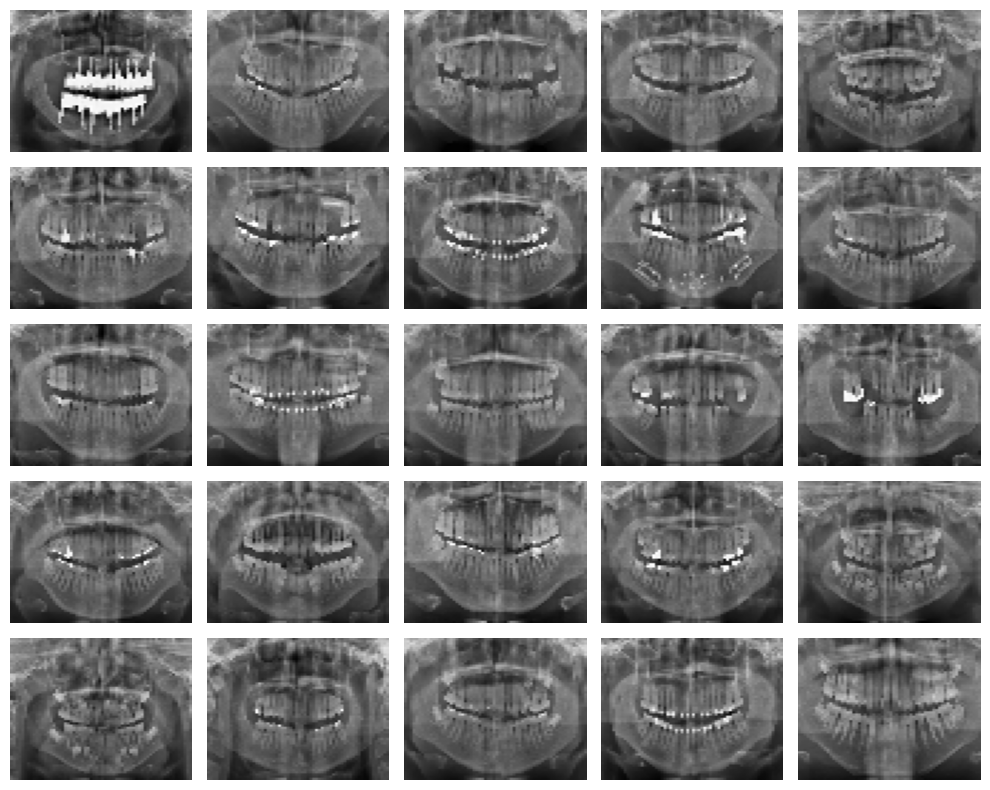

In [6]:
data = data.map(lambda x: x / 255.0)
images = next(iter(data.take(25)))

plt.figure(figsize=(10,8))
for i in range(25):
    plt.subplot(5,5, i + 1)
    plt.imshow(images[i].numpy())
    plt.axis("off")
    plt.gca().set_aspect('auto')

plt.tight_layout()
plt.show()

In [7]:
from keras.models import Sequential
from keras.layers import Dense, Reshape, UpSampling2D, Conv2D, BatchNormalization, Activation

latent_dim=110
g_resolution=2
generator=Sequential()
generator.add(Dense(4*4*256,activation="relu",input_dim=latent_dim))
generator.add(Reshape((4,4,256)))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(128,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(Conv2D(3,kernel_size=3,padding="same"))
generator.add(Activation("tanh"))
generator.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 4096)           │       454,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         3,459 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 64, 64, 3)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,526,979 (9.64 MB)

 Trainable params: 2,525,187 (9.63 MB)

 Non-trainable params: 1,792 (7.00 KB)

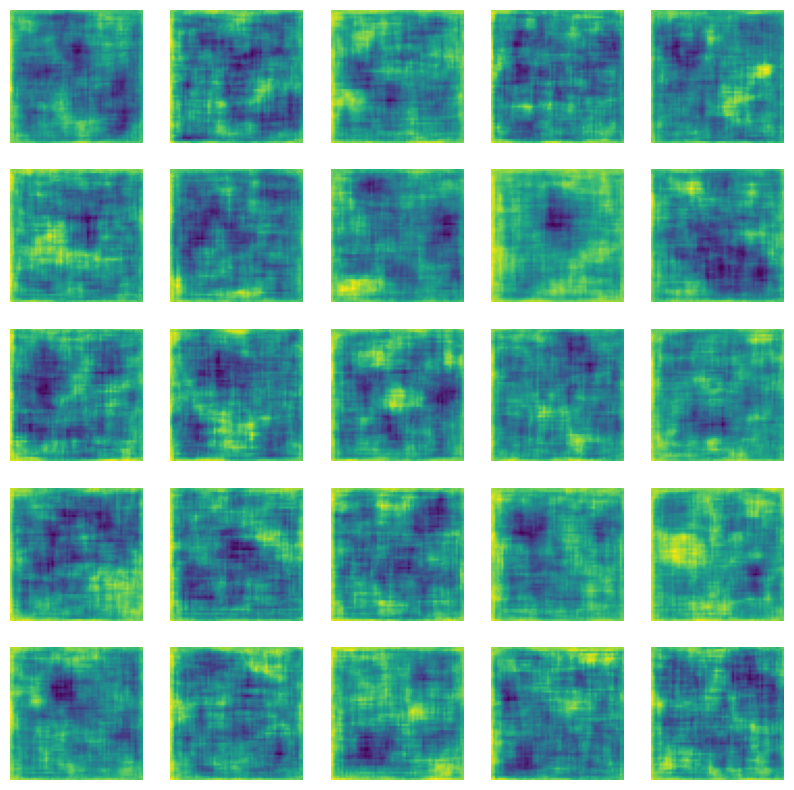

In [8]:
num_images = 25
random_vectors = tf.random.normal([num_images, latent_dim])
generated_images = generator(random_vectors, training=False)

plt.figure(figsize=(10, 10))
for i in range(num_images):
    plt.subplot(5, 5, i + 1)
    plt.imshow(generated_images[i, :, :, 0])
    plt.axis("off")
plt.show()

In [9]:
from keras.layers import Conv2D, LeakyReLU, Dropout, ZeroPadding2D, BatchNormalization, Flatten, Dense


discriminator = Sequential()
discriminator.add(Conv2D(32, kernel_size=3, strides=2, input_shape=(64,64,3), padding="same"))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
discriminator.add(ZeroPadding2D(padding=((0,1),(0,1))))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation="sigmoid"))

discriminator.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/opt/conda/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 17, 17, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 9, 9, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        41,473 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,613,889 (6.16 MB)

 Trainable params: 1,611,969 (6.15 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [10]:
result = discriminator(generated_images)
print (result)

tf.Tensor(
[[0.49877977]
 [0.49847853]
 [0.4985367 ]
 [0.4983564 ]
 [0.49819076]
 [0.49852416]
 [0.49864885]
 [0.49847877]
 [0.49930218]
 [0.497844  ]
 [0.49835533]
 [0.49844572]
 [0.49890587]
 [0.49917352]
 [0.49819225]
 [0.49877995]
 [0.49867833]
 [0.49824333]
 [0.49797854]
 [0.49859858]
 [0.49887684]
 [0.4987958 ]
 [0.49852806]
 [0.49811646]
 [0.49816728]], shape=(25, 1), dtype=float32)


In [11]:
class GAN(tf.keras.Model):
    def __init__(self,discriminator,generator,latent_dim):
        
        
    
        super().__init__()
        self.discriminator=discriminator
        self.generator=generator
        self.latent_dim=latent_dim
        self.seed_generator=tf.keras.random.SeedGenerator(1440)
    
    
    def compile(self,d_optimizer,g_optimizer,loss_fun):
        super().compile()
        self.d_optimizer=d_optimizer
        self.g_optimizer=g_optimizer
        self.loss_fun=loss_fun
        self.d_loss_metric=tf.keras.metrics.Mean(name="d_loss")
        self.g_loss_metric=tf.keras.metrics.Mean(name="g_loss")
        
        
    @property
    
    def metrics(self):
        return [self.d_loss_metric,self.g_loss_metric]
    
    def train_step(self,real_image):
        batch_size=tf.shape(real_image)[0]
        random_vector=tf.random.normal(shape=(batch_size,self.latent_dim))
        
        generated_images=self.generator(random_vector)
        combined_images=tf.concat([generated_images,real_image],axis=0)
        labels=tf.concat([tf.ones((batch_size,1)),tf.zeros((batch_size,1))],axis=0)
        labels+=0.05*tf.random.uniform(tf.shape(labels))
        
        with tf.GradientTape() as tape:
            predictions=self.discriminator(combined_images)
            d_loss=self.loss_fun(labels,predictions)
        grads=tape.gradient(d_loss,self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(zip(grads,self.discriminator.trainable_weights))
        
        random_latent_vectors=tf.random.normal(shape=(batch_size,self.latent_dim))
        
        misleading_labels=tf.zeros((batch_size,1))
        
        
        with tf.GradientTape() as tape:
            predictions=self.discriminator(self.generator(random_latent_vectors))
            g_loss=self.loss_fun(misleading_labels,predictions)
        grads=tape.gradient(g_loss,self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads,self.generator.trainable_weights))
        
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [12]:
class ImageGeneratorCallback(tf.keras.callbacks.Callback):
    def __init__(self, latent_dim):
        super(ImageGeneratorCallback, self).__init__()
        self.latent_dim = latent_dim
        self.generated_images = []

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(tf.random.normal(shape=(36, self.latent_dim)))
        self.generated_images.append(generated_images)
        if (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            fig, ax = plt.subplots(6, 6, figsize=(8, 8))
            for i in range(6):
                for j in range(6):
                    ax[i, j].imshow(generated_images[i * 6 + j])
                    ax[i, j].axis("off")
            plt.suptitle(f"Epoch {epoch + 1}/{epochs} - D Loss: {logs['d_loss']:.4f}, G Loss: {logs['g_loss']:.4f}")
            plt.show()

Epoch 1/200
 3/47 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - d_loss: 0.6578 - g_loss: 0.6929

I0000 00:00:1717471903.180618     124 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


47/47 ━━━━━━━━━━━━━━━━━━━━ 40s 431ms/step - d_loss: 0.6691 - g_loss: 0.7247
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6586 - g_loss: 0.7887
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6420 - g_loss: 0.8773
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - d_loss: 0.6427 - g_loss: 0.9137
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - d_loss: 0.6444 - g_loss: 0.9117
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - d_loss: 0.6468 - g_loss: 0.9252
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6229 - g_loss: 0.9844
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - d_loss: 0.6207 - g_loss: 1.0013
Epoch 9/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6592 - g_loss: 0.9123
Epoch 10/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - d_loss: 0.6552 - g_loss: 0.9088

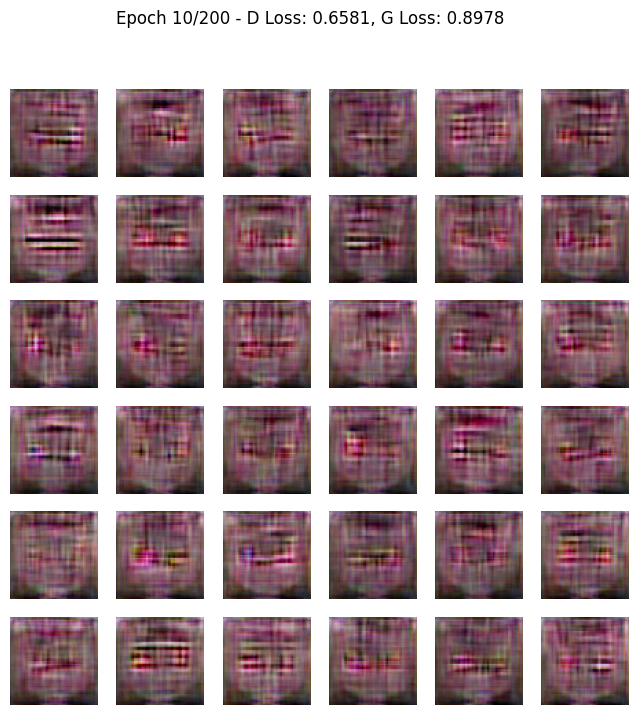

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - d_loss: 0.6552 - g_loss: 0.9086
Epoch 11/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6653 - g_loss: 0.8839
Epoch 12/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 111ms/step - d_loss: 0.6501 - g_loss: 0.9123
Epoch 13/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - d_loss: 0.6506 - g_loss: 0.9357
Epoch 14/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6558 - g_loss: 0.9101
Epoch 15/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6502 - g_loss: 0.9210
Epoch 16/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6448 - g_loss: 0.9302
Epoch 17/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - d_loss: 0.6415 - g_loss: 0.9435
Epoch 18/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6456 - g_loss: 0.9442
Epoch 19/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6525 - g_loss: 0.9241
Epoch 20/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.6528 - g_loss: 0.9114

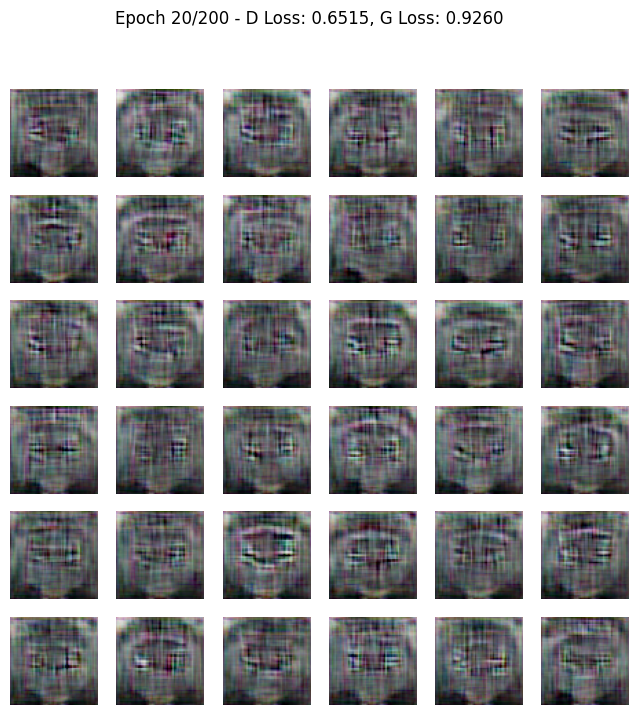

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - d_loss: 0.6528 - g_loss: 0.9117
Epoch 21/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.6587 - g_loss: 0.8697
Epoch 22/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - d_loss: 0.6557 - g_loss: 0.9150
Epoch 23/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6540 - g_loss: 0.9086
Epoch 24/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6612 - g_loss: 0.8881
Epoch 25/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - d_loss: 0.6540 - g_loss: 0.9092
Epoch 26/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6649 - g_loss: 0.8840
Epoch 27/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6533 - g_loss: 0.9030
Epoch 28/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - d_loss: 0.6607 - g_loss: 0.8744
Epoch 29/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6574 - g_loss: 0.9021
Epoch 30/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: 0.6543 - g_loss: 0.9014

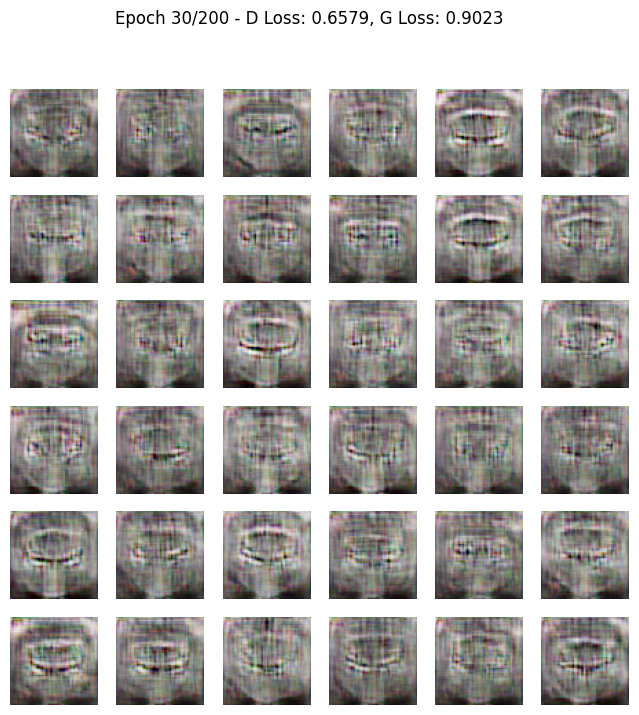

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - d_loss: 0.6543 - g_loss: 0.9014
Epoch 31/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - d_loss: 0.6598 - g_loss: 0.9182
Epoch 32/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.6652 - g_loss: 0.8793
Epoch 33/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - d_loss: 0.6680 - g_loss: 0.8719
Epoch 34/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - d_loss: 0.6637 - g_loss: 0.9244
Epoch 35/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6611 - g_loss: 0.8916
Epoch 36/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6653 - g_loss: 0.8797
Epoch 37/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.6654 - g_loss: 0.8887
Epoch 38/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - d_loss: 0.6625 - g_loss: 0.8869
Epoch 39/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - d_loss: 0.6635 - g_loss: 0.8977
Epoch 40/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.6698 - g_loss: 0.8786

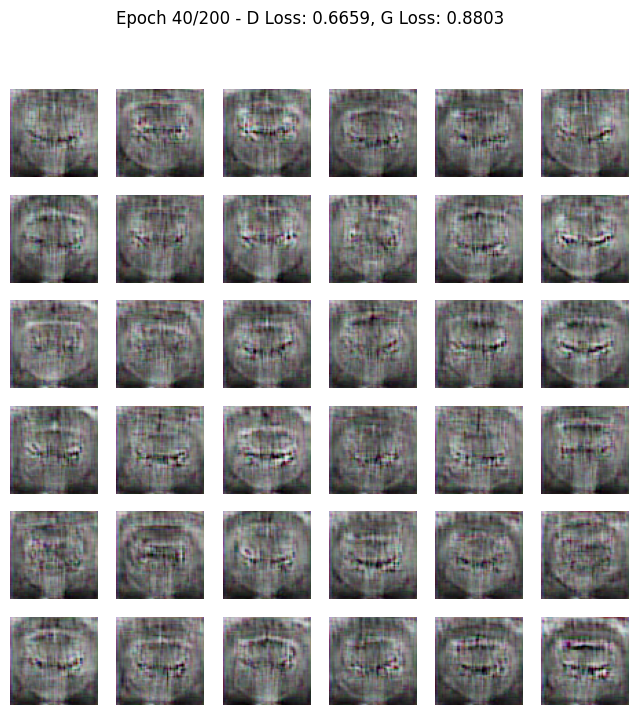

47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 138ms/step - d_loss: 0.6697 - g_loss: 0.8786
Epoch 41/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - d_loss: 0.6603 - g_loss: 0.9029
Epoch 42/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - d_loss: 0.6619 - g_loss: 0.9106
Epoch 43/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6621 - g_loss: 0.8965
Epoch 44/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6611 - g_loss: 0.8902
Epoch 45/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6582 - g_loss: 0.9019
Epoch 46/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6603 - g_loss: 0.8932
Epoch 47/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6630 - g_loss: 0.9066
Epoch 48/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - d_loss: 0.6627 - g_loss: 0.8759
Epoch 49/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6620 - g_loss: 0.8917
Epoch 50/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - d_loss: 0.6623 - g_loss: 0.8769

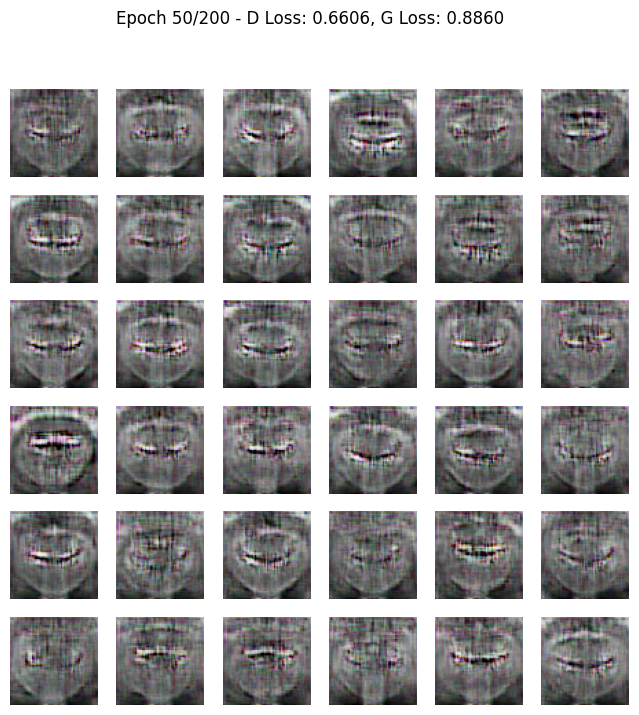

47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step - d_loss: 0.6623 - g_loss: 0.8771
Epoch 51/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6606 - g_loss: 0.8997
Epoch 52/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6597 - g_loss: 0.8912
Epoch 53/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.6607 - g_loss: 0.8889
Epoch 54/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - d_loss: 0.6615 - g_loss: 0.9059
Epoch 55/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - d_loss: 0.6577 - g_loss: 0.8837
Epoch 56/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6602 - g_loss: 0.8841
Epoch 57/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6579 - g_loss: 0.9049
Epoch 58/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6578 - g_loss: 0.9017
Epoch 59/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - d_loss: 0.6538 - g_loss: 0.9042
Epoch 60/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.6561 - g_loss: 0.8988

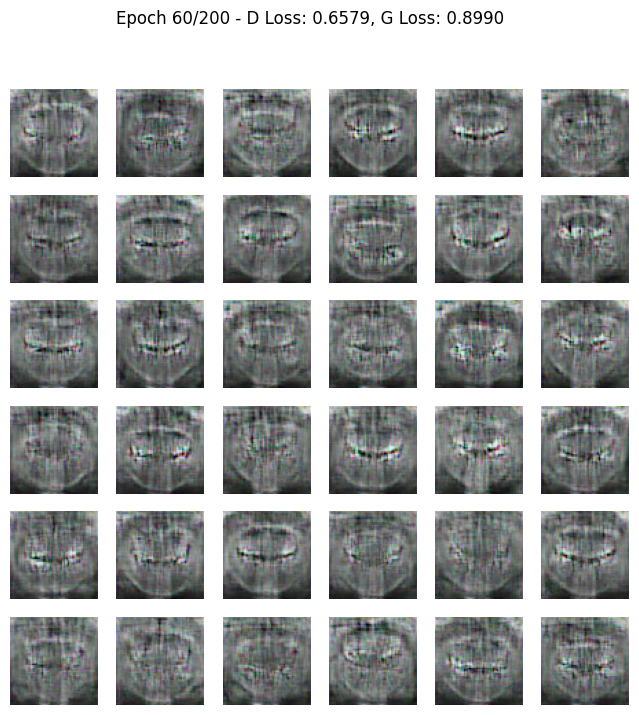

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - d_loss: 0.6561 - g_loss: 0.8988
Epoch 61/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - d_loss: 0.6542 - g_loss: 0.9076
Epoch 62/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6615 - g_loss: 0.9028
Epoch 63/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6563 - g_loss: 0.9199
Epoch 64/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6584 - g_loss: 0.9093
Epoch 65/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - d_loss: 0.6556 - g_loss: 0.9169
Epoch 66/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - d_loss: 0.6602 - g_loss: 0.9083
Epoch 67/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6582 - g_loss: 0.9215
Epoch 68/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6584 - g_loss: 0.8986
Epoch 69/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6562 - g_loss: 0.9066
Epoch 70/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.6531 - g_loss: 0.9146

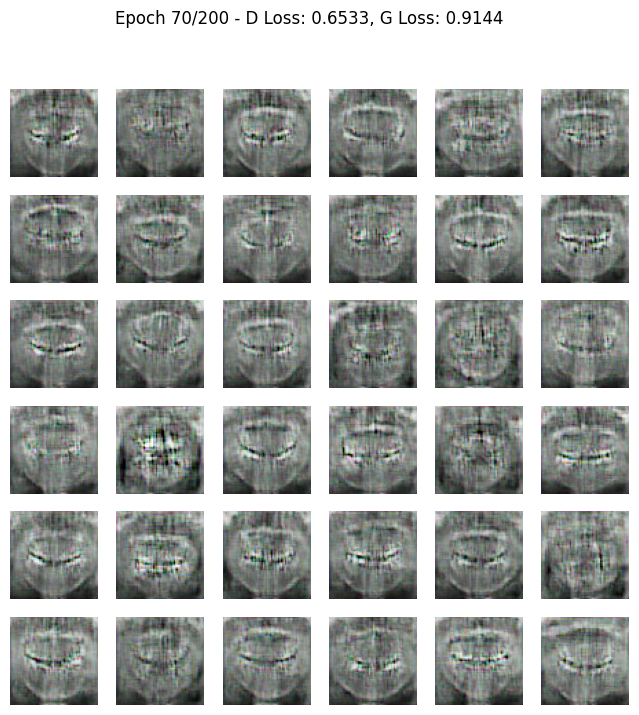

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - d_loss: 0.6531 - g_loss: 0.9146
Epoch 71/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6559 - g_loss: 0.9087
Epoch 72/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - d_loss: 0.6649 - g_loss: 0.8980
Epoch 73/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.6542 - g_loss: 0.9039
Epoch 74/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - d_loss: 0.6555 - g_loss: 0.9012
Epoch 75/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - d_loss: 0.6524 - g_loss: 0.9160
Epoch 76/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6559 - g_loss: 0.9173
Epoch 77/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6573 - g_loss: 0.9341
Epoch 78/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6568 - g_loss: 0.9307
Epoch 79/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6552 - g_loss: 0.9272
Epoch 80/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 0.6555 - g_loss: 0.9285

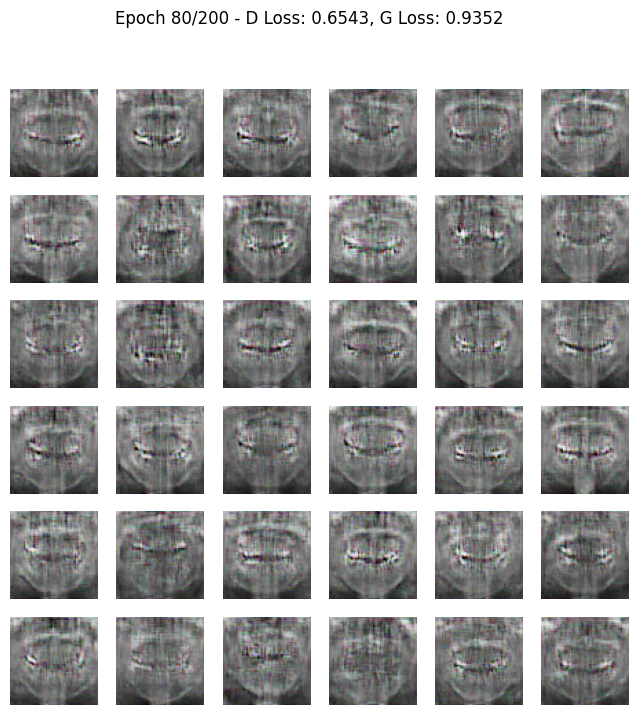

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - d_loss: 0.6555 - g_loss: 0.9287
Epoch 81/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - d_loss: 0.6513 - g_loss: 0.9414
Epoch 82/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6482 - g_loss: 0.9006
Epoch 83/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6488 - g_loss: 0.9502
Epoch 84/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6537 - g_loss: 0.9283
Epoch 85/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - d_loss: 0.6479 - g_loss: 0.9249
Epoch 86/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - d_loss: 0.6497 - g_loss: 0.9310
Epoch 87/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6486 - g_loss: 0.9105
Epoch 88/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.6425 - g_loss: 0.9341
Epoch 89/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6443 - g_loss: 0.9304
Epoch 90/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - d_loss: 0.6442 - g_loss: 0.9379

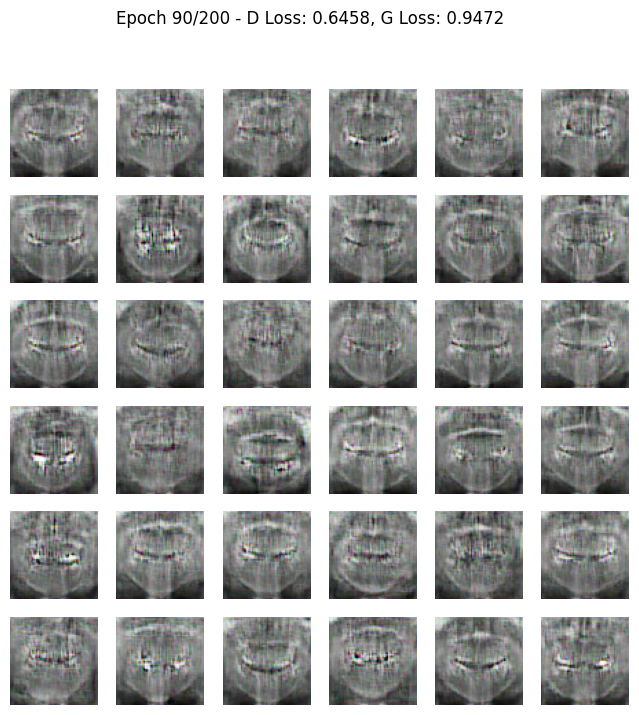

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - d_loss: 0.6442 - g_loss: 0.9381
Epoch 91/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - d_loss: 0.6385 - g_loss: 0.9538
Epoch 92/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6447 - g_loss: 0.9498
Epoch 93/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - d_loss: 0.6424 - g_loss: 0.9458
Epoch 94/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6459 - g_loss: 0.9239
Epoch 95/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6463 - g_loss: 0.9420
Epoch 96/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - d_loss: 0.6398 - g_loss: 0.9552
Epoch 97/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6409 - g_loss: 0.9469
Epoch 98/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6402 - g_loss: 0.9612
Epoch 99/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6441 - g_loss: 0.9756
Epoch 100/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.6449 - g_loss: 0.9342

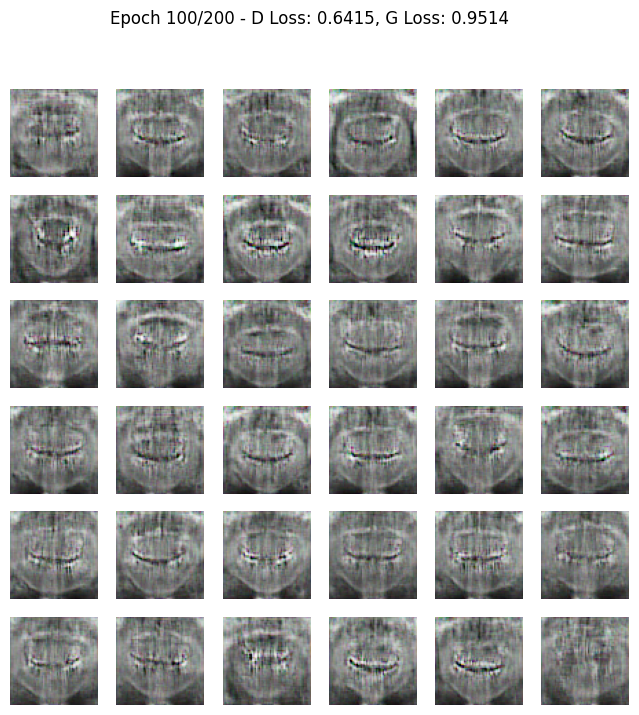

47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - d_loss: 0.6448 - g_loss: 0.9346
Epoch 101/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.6426 - g_loss: 0.9690
Epoch 102/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - d_loss: 0.6384 - g_loss: 0.9673
Epoch 103/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6453 - g_loss: 0.9645
Epoch 104/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6431 - g_loss: 0.9627
Epoch 105/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6376 - g_loss: 0.9787
Epoch 106/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6352 - g_loss: 0.9661
Epoch 107/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - d_loss: 0.6348 - g_loss: 0.9839
Epoch 108/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6351 - g_loss: 0.9748
Epoch 109/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - d_loss: 0.6373 - g_loss: 0.9656
Epoch 110/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.6371 - g_loss: 0.9532

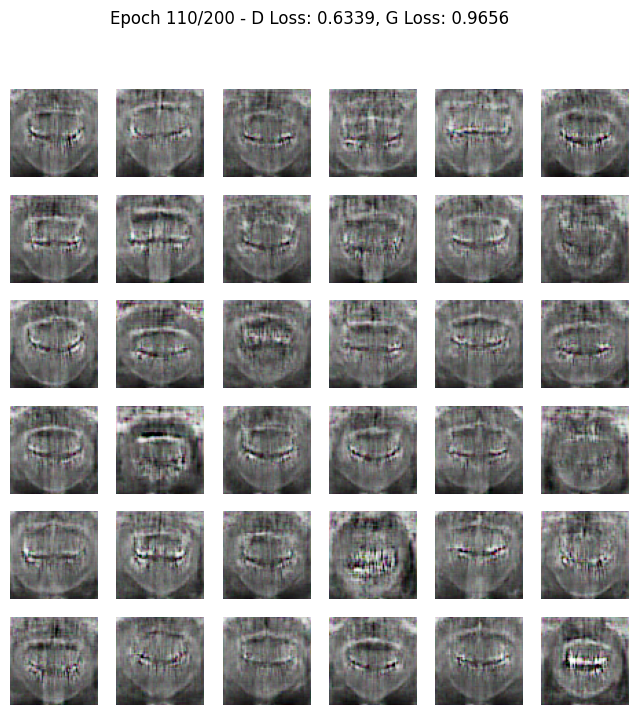

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - d_loss: 0.6370 - g_loss: 0.9534
Epoch 111/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6341 - g_loss: 0.9648
Epoch 112/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - d_loss: 0.6344 - g_loss: 0.9550
Epoch 113/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - d_loss: 0.6332 - g_loss: 0.9606
Epoch 114/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6301 - g_loss: 0.9881
Epoch 115/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6306 - g_loss: 0.9593
Epoch 116/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6242 - g_loss: 0.9853
Epoch 117/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 262ms/step - d_loss: 0.6368 - g_loss: 0.9974
Epoch 118/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - d_loss: 0.6238 - g_loss: 1.0153
Epoch 119/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6321 - g_loss: 0.9752
Epoch 120/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: 0.6261 - g_loss: 0.9771

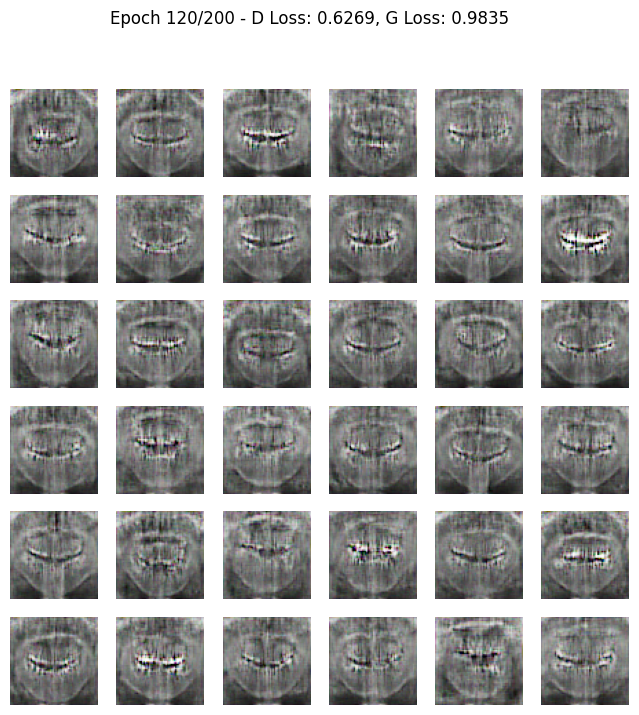

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - d_loss: 0.6261 - g_loss: 0.9773
Epoch 121/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6262 - g_loss: 0.9933
Epoch 122/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - d_loss: 0.6248 - g_loss: 0.9863
Epoch 123/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - d_loss: 0.6229 - g_loss: 1.0130
Epoch 124/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6221 - g_loss: 1.0072
Epoch 125/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6287 - g_loss: 0.9982
Epoch 126/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - d_loss: 0.6273 - g_loss: 0.9720
Epoch 127/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6234 - g_loss: 1.0217
Epoch 128/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6234 - g_loss: 0.9820
Epoch 129/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6135 - g_loss: 1.0158
Epoch 130/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - d_loss: 0.6116 - g_loss: 1.0196

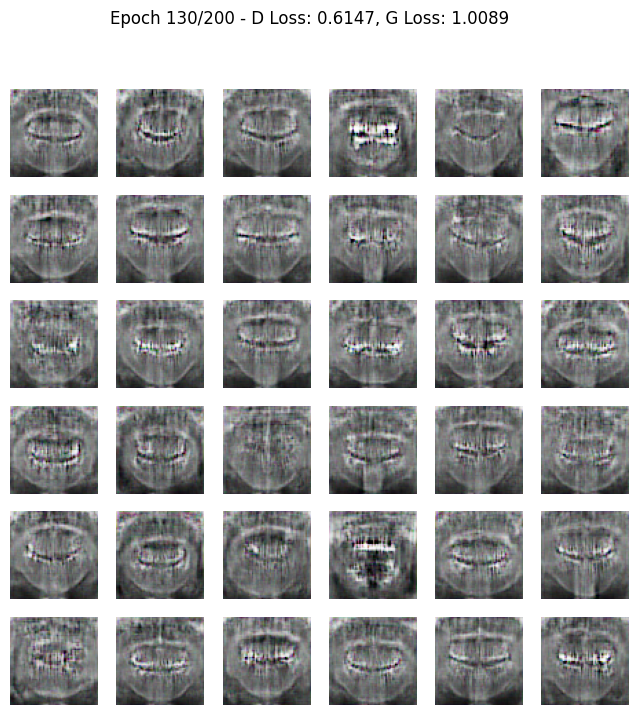

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - d_loss: 0.6117 - g_loss: 1.0194
Epoch 131/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 117ms/step - d_loss: 0.6187 - g_loss: 1.0203
Epoch 132/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6125 - g_loss: 1.0031
Epoch 133/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - d_loss: 0.6026 - g_loss: 1.0162
Epoch 134/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6070 - g_loss: 1.0175
Epoch 135/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - d_loss: 0.6128 - g_loss: 1.0249
Epoch 136/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6170 - g_loss: 1.0065
Epoch 137/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - d_loss: 0.6146 - g_loss: 1.0110
Epoch 138/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.6098 - g_loss: 1.0256
Epoch 139/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6056 - g_loss: 1.0742
Epoch 140/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.6099 - g_loss: 1.0439

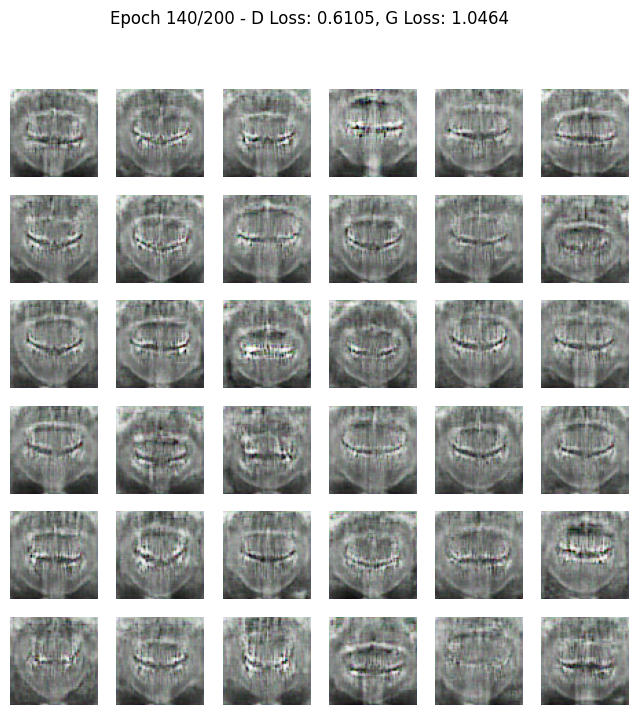

47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - d_loss: 0.6099 - g_loss: 1.0439
Epoch 141/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - d_loss: 0.6104 - g_loss: 1.0191
Epoch 142/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.6038 - g_loss: 1.0570
Epoch 143/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6010 - g_loss: 1.0542
Epoch 144/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5990 - g_loss: 1.0288
Epoch 145/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.6026 - g_loss: 1.0554
Epoch 146/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5940 - g_loss: 1.0601
Epoch 147/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - d_loss: 0.6020 - g_loss: 1.0529
Epoch 148/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.6005 - g_loss: 1.0795
Epoch 149/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5893 - g_loss: 1.1013
Epoch 150/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 0.5982 - g_loss: 1.0793

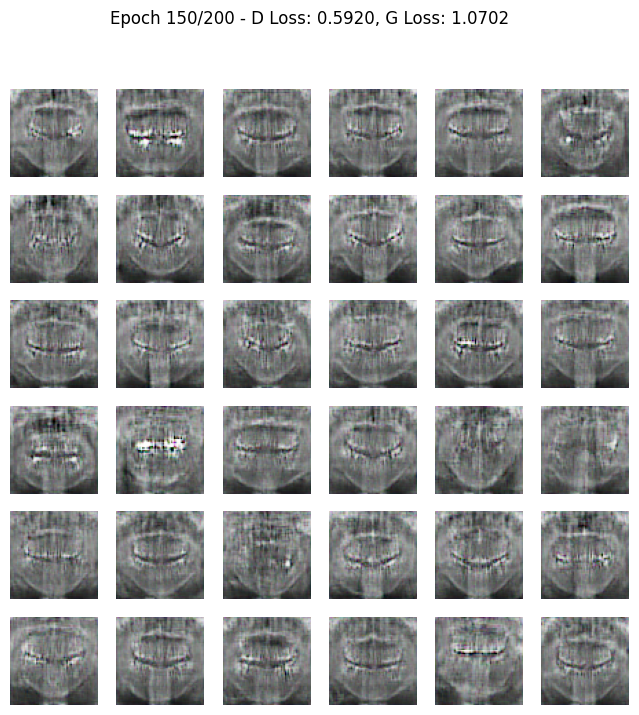

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - d_loss: 0.5981 - g_loss: 1.0791
Epoch 151/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5936 - g_loss: 1.0632
Epoch 152/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5901 - g_loss: 1.0568
Epoch 153/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - d_loss: 0.5906 - g_loss: 1.0626
Epoch 154/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.5954 - g_loss: 1.0680
Epoch 155/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5922 - g_loss: 1.0704
Epoch 156/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5880 - g_loss: 1.0763
Epoch 157/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5861 - g_loss: 1.0736
Epoch 158/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5828 - g_loss: 1.1064
Epoch 159/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - d_loss: 0.5843 - g_loss: 1.0830
Epoch 160/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 0.5788 - g_loss: 1.0836

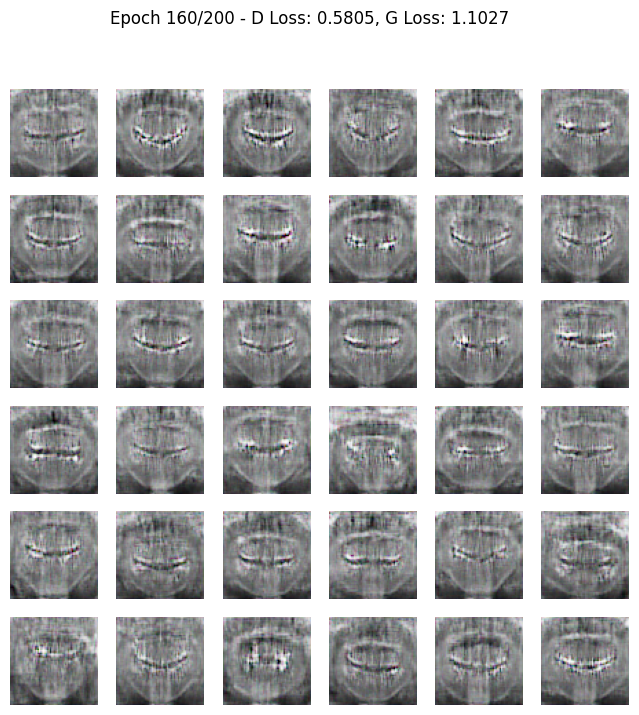

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - d_loss: 0.5788 - g_loss: 1.0840
Epoch 161/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.5732 - g_loss: 1.1077
Epoch 162/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.5816 - g_loss: 1.1049
Epoch 163/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5789 - g_loss: 1.1186
Epoch 164/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5788 - g_loss: 1.0914
Epoch 165/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - d_loss: 0.5723 - g_loss: 1.1289
Epoch 166/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5692 - g_loss: 1.1493
Epoch 167/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - d_loss: 0.5725 - g_loss: 1.0928
Epoch 168/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.5633 - g_loss: 1.1287
Epoch 169/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5702 - g_loss: 1.1630
Epoch 170/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.5634 - g_loss: 1.1548

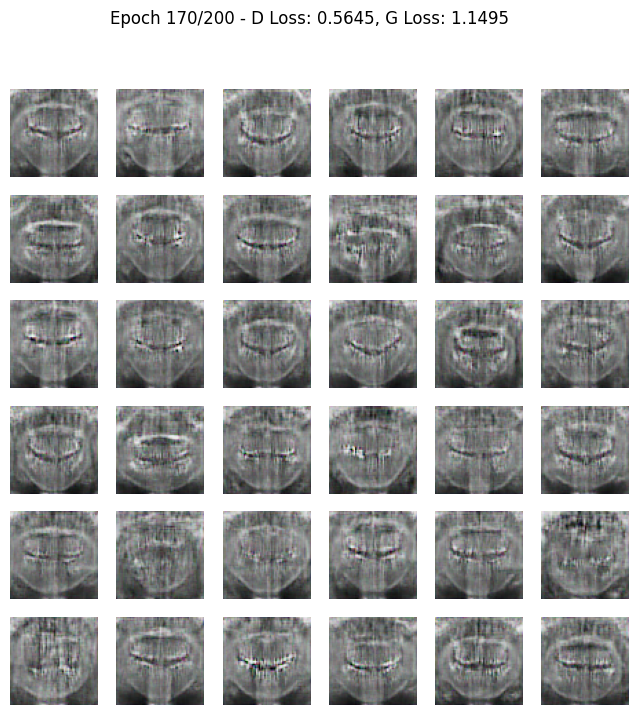

47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - d_loss: 0.5634 - g_loss: 1.1547
Epoch 171/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - d_loss: 0.5644 - g_loss: 1.1355
Epoch 172/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5625 - g_loss: 1.1641
Epoch 173/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.5548 - g_loss: 1.1668
Epoch 174/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5654 - g_loss: 1.1108
Epoch 175/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - d_loss: 0.5553 - g_loss: 1.1320
Epoch 176/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - d_loss: 0.5560 - g_loss: 1.1667
Epoch 177/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.5404 - g_loss: 1.1785
Epoch 178/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - d_loss: 0.5511 - g_loss: 1.1756
Epoch 179/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - d_loss: 0.5477 - g_loss: 1.2114
Epoch 180/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 0.5546 - g_loss: 1.1710

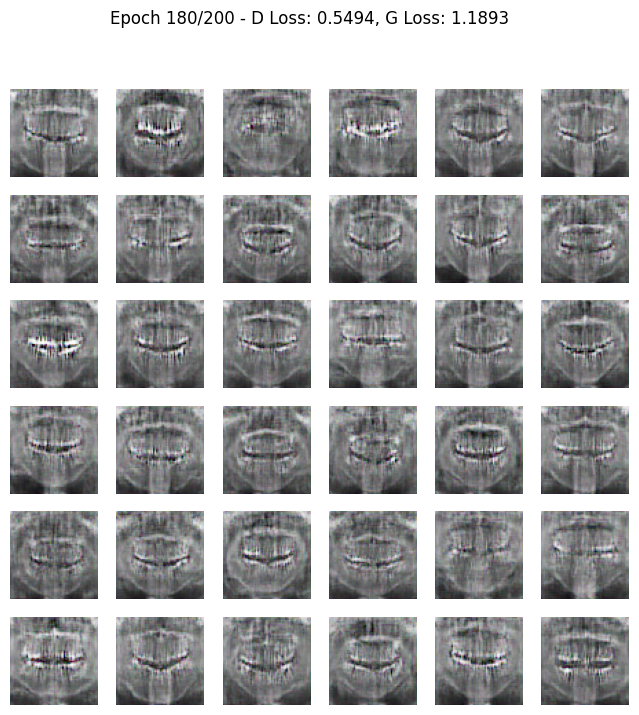

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - d_loss: 0.5545 - g_loss: 1.1714
Epoch 181/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - d_loss: 0.5426 - g_loss: 1.2181
Epoch 182/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.5456 - g_loss: 1.1677
Epoch 183/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5372 - g_loss: 1.1932
Epoch 184/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5466 - g_loss: 1.1969
Epoch 185/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - d_loss: 0.5397 - g_loss: 1.2345
Epoch 186/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - d_loss: 0.5359 - g_loss: 1.2192
Epoch 187/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5354 - g_loss: 1.2581
Epoch 188/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.5321 - g_loss: 1.2596
Epoch 189/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.5305 - g_loss: 1.2371
Epoch 190/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.5392 - g_loss: 1.2120

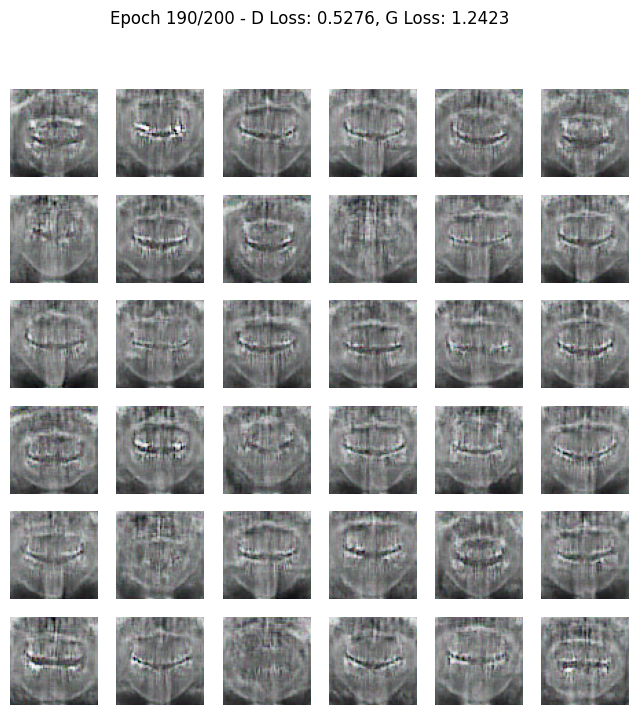

47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - d_loss: 0.5390 - g_loss: 1.2126
Epoch 191/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5312 - g_loss: 1.2091
Epoch 192/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - d_loss: 0.5328 - g_loss: 1.2154
Epoch 193/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - d_loss: 0.5291 - g_loss: 1.2978
Epoch 194/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5096 - g_loss: 1.2799
Epoch 195/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - d_loss: 0.5145 - g_loss: 1.2871
Epoch 196/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - d_loss: 0.5202 - g_loss: 1.2535
Epoch 197/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - d_loss: 0.5101 - g_loss: 1.2434
Epoch 198/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - d_loss: 0.5037 - g_loss: 1.2810
Epoch 199/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - d_loss: 0.5186 - g_loss: 1.2580
Epoch 200/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.5115 - g_loss: 1.2665

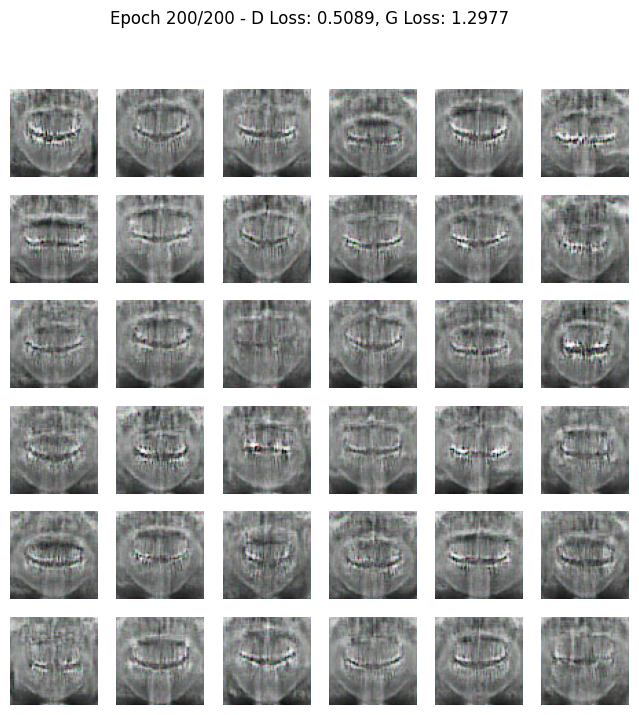

47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 138ms/step - d_loss: 0.5114 - g_loss: 1.2671


In [13]:
epochs = 200
batch_size = 32
learning_rate = 0.0001
decay_steps = 1000
decay_rate = 0.95
epsilon = 1e-07

d_learning_rate=tf.keras.optimizers.schedules.ExponentialDecay(learning_rate,decay_steps,decay_rate,
                                                              staircase=True)
g_learning_rate = tf.keras.optimizers.schedules.ExponentialDecay(learning_rate, decay_steps, decay_rate, 
                                                                 staircase=True)

model=GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

model.compile(d_optimizer=tf.keras.optimizers.RMSprop(learning_rate=d_learning_rate,epsilon=epsilon),
            g_optimizer=tf.keras.optimizers.RMSprop(learning_rate=g_learning_rate,epsilon=epsilon),
            loss_fun=tf.keras.losses.BinaryCrossentropy())
image_callback = ImageGeneratorCallback(latent_dim)
history = model.fit(data, epochs=epochs, batch_size=batch_size, callbacks=[image_callback])

In [14]:
import io
import os
import zipfile


zip_buffer = io.BytesIO()

with zipfile.ZipFile(zip_buffer, 'a', zipfile.ZIP_DEFLATED, False) as zip_file:
    for epoch, generated_images in enumerate(image_callback.generated_images, start=1):
        fig, axs = plt.subplots(6, 6, figsize=(10, 10))
        for i in range(6):
            for j in range(6):
                axs[i, j].imshow(generated_images[i * 6 + j])
                axs[i, j].axis('off')
        
        plt.suptitle(f"Epoch {epoch}/{epochs}")
        plt.savefig(f"epoch_{epoch}_images.png")
        plt.close(fig)
        
        zip_file.write(f"epoch_{epoch}_images.png", f"epoch_{epoch}_images.png")
        os.remove(f"epoch_{epoch}_images.png")

with open("generated_images.zip", "wb") as f:
    f.write(zip_buffer.getvalue())

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


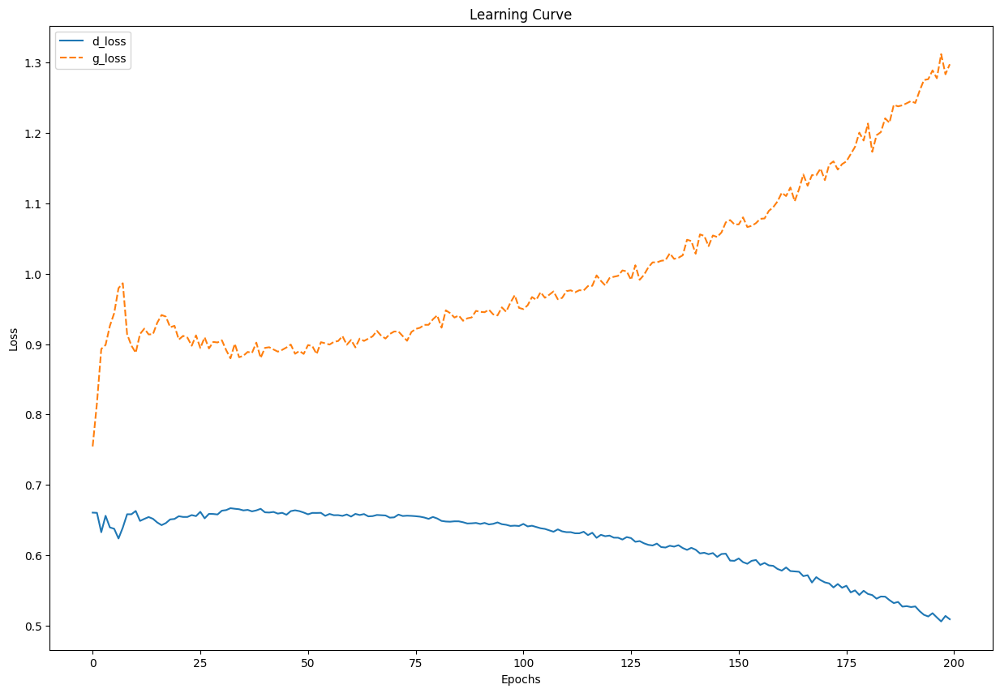

In [15]:
import seaborn as sns
fig = plt.figure(figsize=(15, 10))
ax = sns.lineplot(data=history.history)
ax.set(xlabel="Epochs")
ax.set(ylabel="Loss")
ax.set_title("Learning Curve")
plt.show()

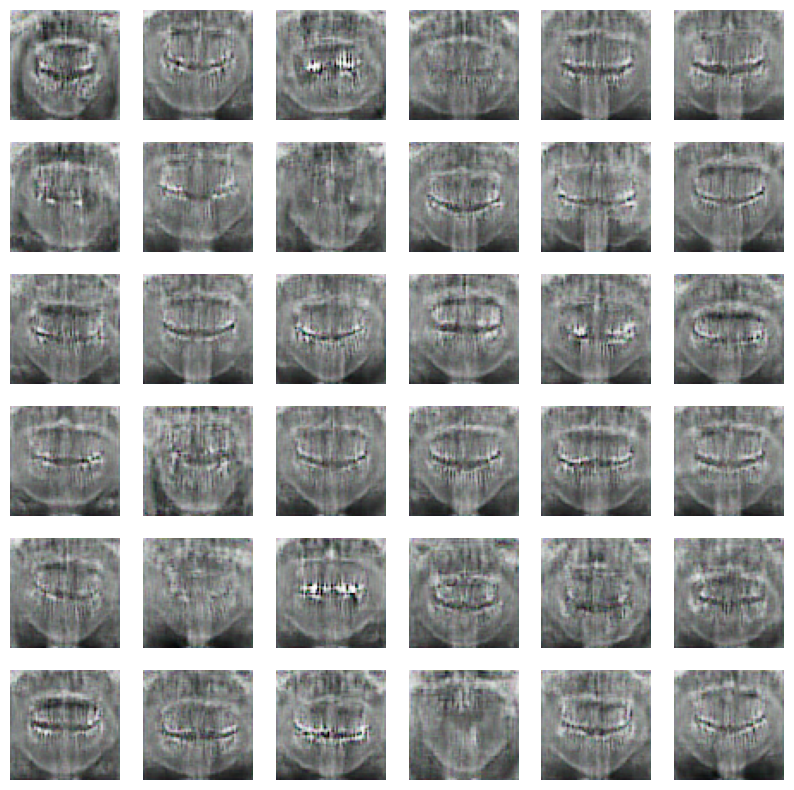

In [16]:
def generate_and_display_images(generator, num_images, latent_dim):
    generated_images = generator(tf.random.normal([num_images, latent_dim]), training=False)
    
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(num_images//6, num_images//6, i+1)
        plt.imshow(generated_images[i], cmap='gray', vmin=0, vmax=1)
        plt.axis('off')
    plt.show()

num_images = 36
generate_and_display_images(generator, num_images, latent_dim)

In [27]:
import numpy as np

def enhance_image_contrast(image):
    # Ensure the image is in the correct format
    if not isinstance(image, np.ndarray):
        # Convert the image to a NumPy array
        image = np.array(image)
    
    # Convert the image to grayscale if it's not already
    if len(image.shape) > 2:
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        image_gray = image
    
    # Ensure the image is in the correct data type (CV_8UC1)
    if image_gray.dtype != np.uint8:
        image_gray = image_gray.astype(np.uint8)
    
    # Apply histogram equalization to enhance contrast
    enhanced_image = cv2.equalizeHist(image_gray)
    
    return enhanced_image

# Example usage:
enhanced_generated_images = [enhance_image_contrast(img) for img in generated_images]


InvalidArgumentError: {{function_node __wrapped__StridedSlice_device_/job:localhost/replica:0/task:0/device:GPU:0}} slice index 32 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/

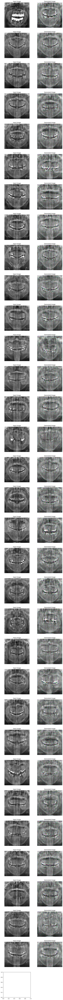

In [32]:
def compare_input_and_generated_images(images, generated_images, num_images):
    plt.figure(figsize=(10, num_images * 5))
    for i in range(num_images):
        plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(images[i], cmap='gray')  # Display input image i
        plt.title("Input Image")
        plt.axis('off')
        
        plt.subplot(num_images, 2, 2*i + 2)
        plt.imshow(generated_images[i], cmap='gray')  # Display generated image i
        plt.title("Generated Image")
        plt.axis('off')
    plt.show()

# Example usage:
compare_input_and_generated_images(images, generated_images, num_images)
